# Cave Painting Preprocessing Comparison

This notebook lets you compare multiple preprocessing pipelines on 5 images.
You can modify preprocessing parameters and immediately visualize the effects.


In [12]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

plt.rcParams["figure.figsize"] = (14, 10)


## Preprocessing Functions

In [13]:

def convert_color_space(img, color_space):
    if color_space == "rgb":
        return img
    if color_space == "gray":
        return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if color_space == "hsv":
        return cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    if color_space == "lab":
        return cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    raise ValueError(color_space)


def equalize_image(img):
    if img.ndim == 2:
        return cv2.equalizeHist(img)
    ch = cv2.split(img)
    ch = [cv2.equalizeHist(c) for c in ch]
    return cv2.merge(ch)


def clahe_image(img, clip=2.0, grid=(8,8)):
    clahe = cv2.createCLAHE(clipLimit=clip, tileGridSize=grid)
    if img.ndim == 2:
        return clahe.apply(img)
    ch = cv2.split(img)
    ch = [clahe.apply(c) for c in ch]
    return cv2.merge(ch)


def decorrelation_stretch(img):
    if img.ndim != 3:
        return img
    X = img.astype(np.float32).reshape(-1,3)
    mean = X.mean(axis=0)
    Xc = X - mean
    cov = np.cov(Xc, rowvar=False)
    w, v = np.linalg.eigh(cov)
    W = v @ np.diag(1.0/np.sqrt(w+1e-5)) @ v.T
    Xw = Xc @ W.T
    Xw -= Xw.min()
    Xw /= Xw.max()
    Xw *= 255
    return Xw.reshape(img.shape).astype(np.uint8)


def denoise(img, method=None, g_sigma=1.0, m_ksize=5):
    if method is None:
        return img
    if method == "gaussian":
        k = int(g_sigma*6+1)|1
        return cv2.GaussianBlur(img,(k,k),g_sigma)
    if method == "median":
        if m_ksize % 2 == 0:
            m_ksize += 1
        return cv2.medianBlur(img, m_ksize)
    raise ValueError(method)


def preprocess(img,
               color_space="rgb",
               contrast=None,
               noise=None,
               decorrelate=False):
    
    out = convert_color_space(img, color_space)
    
    if decorrelate:
        out = decorrelation_stretch(out)
        
    if contrast == "equalize":
        out = equalize_image(out)
    elif contrast == "clahe":
        out = clahe_image(out)
        
    out = denoise(out, noise)
    return out


## Load 5 Images

Edit the folder path.

In [14]:

img_dir = Path("dataset/chauvet")   # CHANGE THIS

paths = list(img_dir.glob("**/*.jpg"))[:5]
print(paths)

images = []
for p in paths:
    bgr = cv2.imread(str(p))
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
    images.append((p.name, rgb))


[WindowsPath('dataset/chauvet/owl-engraving-chauvet-cave-replica-6348.jpg'), WindowsPath('dataset/chauvet/panel-of-the-horses-chauvet-cave-replica-6349.jpg'), WindowsPath('dataset/chauvet/panel-of-the-lions-detail-chauvet-cave-6345.jpg'), WindowsPath('dataset/chauvet/panel-of-the-rhinos-chauvet-cave-replica-6350.jpg'), WindowsPath('dataset/chauvet/red-dots-cluster-chauvet-cave-replica-6347.jpg')]


## Define Preprocessing Variants

In [30]:

pipelines = {
    "baseline": dict(),
    
    "rgb_equalize": dict(
        color_space="rgb",
        contrast="equalize"
    ),
    
    "lab_clahe": dict(
        color_space="lab",
        contrast="clahe"
    ),
    
    "lab_equalize": dict(
        color_space="lab",
        contrast="equalize"
    ),
    
    "lab_clahe_median": dict(
        color_space="lab",
        contrast="clahe",
        noise="median"
    ),
    
    "decorrelation": dict(
        decorrelate=True,
        # contrast="equalize"
    ),
    
    "decorrelation_lab": dict(
        color_space="lab",
        contrast="clahe",
        decorrelate=True,
        # contrast="equalize"
    ),
    
    "decorrelation_hsv": dict(
        color_space="hsv",
        decorrelate=True,
        # contrast="equalize"
    ),
    
    "gray_eq_gauss": dict(
        color_space="gray",
        contrast="equalize",
        noise="gaussian"
    ),
}


pipelines_charcoal = {
    "baseline": dict(),
    
    # "rgb_equalize": dict(
    #     color_space="rgb",
    #     contrast="equalize"
    # ),
    
    "lab_clahe": dict(
        color_space="lab",
        contrast="clahe"
    ),
    
    "lab_equalize": dict(
        color_space="lab",
        contrast="equalize"
    ),
    
    "lab_clahe_median": dict(
        color_space="lab",
        contrast="clahe",
        noise="median"
    ),
    
    "lab_clahe_gauss": dict(
        color_space="lab",
        contrast="clahe",
        noise="gaussian"
    ),
    
    # "decorrelation": dict(
    #     decorrelate=True,
    #     # contrast="equalize"
    # ),
    
    "decorrelation_lab_clahe": dict(
        color_space="lab",
        contrast="clahe",
        decorrelate=True,
        # contrast="equalize"
    ),
    
    # "decorrelation_hsv": dict(
    #     color_space="hsv",
    #     decorrelate=True,
    #     # contrast="equalize"
    # ),
    
    "gray_eq_gauss": dict(
        color_space="gray",
        contrast="equalize",
        noise="gaussian"
    ),
    
    "gray_clahe_gauss": dict(
        color_space="gray",
        contrast="clahe",
        noise="gaussian"
    ),
}


## Visualization Grid

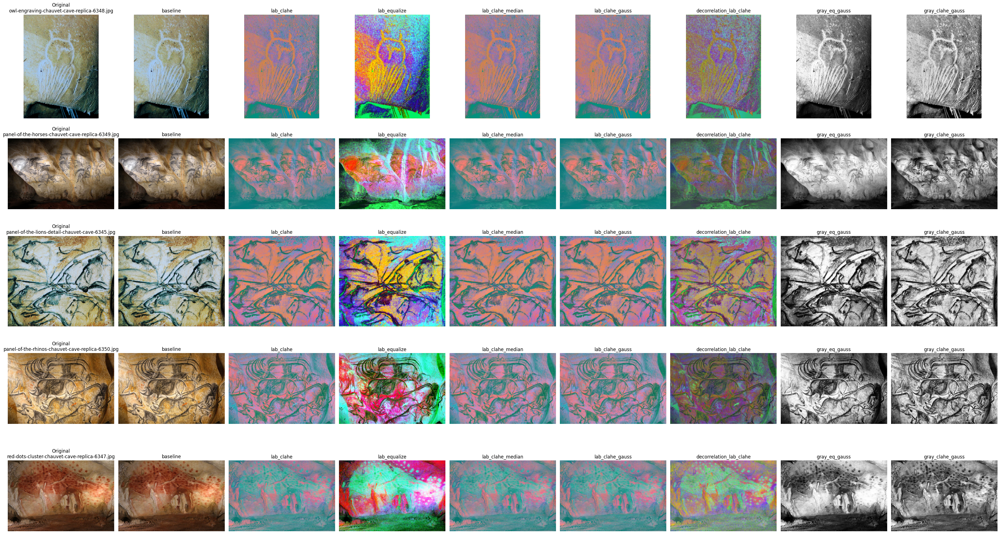

In [39]:

def show_grid(images, pipelines):
    n_img = len(images)
    n_pipe = len(pipelines)
    
    fig, axes = plt.subplots(n_img, n_pipe+1, figsize=(4*(n_pipe+1), 4*n_img))
    
    for r, (name, img) in enumerate(images):
        
        axes[r,0].imshow(img, cmap=None if img.ndim==3 else "gray")
        axes[r,0].set_title(f"Original\n{name}")
        axes[r,0].axis("off")
        
        for c, (pname, cfg) in enumerate(pipelines.items(), start=1):
            out = preprocess(img, **cfg)
            
            if out.ndim == 2:
                axes[r,c].imshow(out, cmap="gray")
            else:
                axes[r,c].imshow(out)
                
            axes[r,c].set_title(pname)
            axes[r,c].axis("off")
            
    plt.tight_layout()
    plt.show()


# show_grid(images, pipelines)
show_grid(images, pipelines_charcoal)


Au vu du tableau ci-dessus, on peut définir une pipeline de preprocessing pour les images au charbon (le rendre plus propre, faire des comparaisons). Le passage en lab et l'égalisation d'histogramme par clahe semble convenir le plus.

In [ ]:
def preprocess_charcoal_image(img):
    
    out = convert_color_space(img, "lab")
    out = clahe_image(out)
        
    return out